In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('./data/trade_data_additional.csv', thousands = ',')

In [3]:
print(data.columns)
print(len(data))
data.head()
data[['price', 'address', 'contactDate', 'distHangangTopBottom']].head()
#data['exclusiveRate'].tail(5)
data.head()
# price: 거래가격
# contactDay: 거래날짜
# supplyArea: 면적
# address: 주소
# constructionCompanyName: 아파트 브랜드
# distHangangTopBottom: 한강까지의 거리
# distStation: 역까지의 거리
# distHospital: 병원까지의 거리

Index(['id', 'detailAddress', 'complexName', 'exclusiveArea', 'contactDate',
       'price', 'floor', 'constructYear', 'roadAddress', 'complexNo',
       'pyeongNo', 'supplyArea', 'supplyPyeong', 'exclusivePyeong',
       'householdCountByPyeong', 'realEstateTypeCode', 'exclusiveRate',
       'entranceType', 'roomCnt', 'bathroomCnt', 'complexName.1', 'cortarNo',
       'roadAddress.1', 'latitude', 'longitude', 'totalHouseholdCount',
       'totalLeaseHouseholdCount', 'highFloor', 'lowFloor', 'completionMonth',
       'totalDongCount', 'maxSupplyArea', 'minSupplyArea', 'dealCount',
       'rentCount', 'batlRatio', 'btlRatio', 'parkingCountByHousehold',
       'constructionCompanyName', 'heatMethodTypeCode', 'heatFuelTypeCode',
       'address', 'distHangangTopBottom', 'distStation', 'distHospital',
       'distHangangCenter'],
      dtype='object')
917908


,id,detailAddress,complexName,exclusiveArea,contactDate,price,floor,constructYear,roadAddress,complexNo,...,btlRatio,parkingCountByHousehold,constructionCompanyName,heatMethodTypeCode,heatFuelTypeCode,address,distHangangTopBottom,distStation,distHospital,distHangangCenter
0,0,713,브라운스톤방학아파트,84.90,2005-11-01 00:00:00,171000000,17,2003,도봉로146길 36,8824.0,...,0.0,1.18,이수건설주식회사,HT001,HF001,서울시 도봉구 방학동,14375.17,431.24,2396.21,14027.70
1,1,655-2,개포2차현대아파트(220),77.75,2012-05-01 00:00:00,660000000,4,1988,언주로 103,10329.0,...,20.0,0.00,현대산업개발(주),HT002,HF001,서울시 강남구 개포동,14322.53,825.40,1401.62,14356.18
2,2,655-2,개포2차현대아파트(220),77.75,2012-07-09 00:00:00,580000000,2,1988,언주로 103,10329.0,...,20.0,0.00,현대산업개발(주),HT002,HF001,서울시 강남구 개포동,14322.53,825.40,1401.62,14356.18
3,3,658-1,개포6차우성아파트1동~8동,67.28,2012-12-26 00:00:00,557000000,3,1987,언주로 3,770.0,...,21.0,1.00,우성건설(주),HT001,HF001,서울시 강남구 개포동,5818.99,1155.09,2020.72,5398.67
4,4,658-1,개포6차우성아파트1동~8동,54.98,2010-01-28 00:00:00,660000000,3,1987,언주로 3,770.0,...,21.0,1.00,우성건설(주),HT001,HF001,서울시 강남구 개포동,5818.99,1155.09,2020.72,5398.67


# 1. 지역별 가격 추이
## 1.1. 정보 취합

In [4]:
# 지역별로 dict에 저장
data_region = {} # data_region { 지역(구): (거래연도, 평당가격) }

for x in data[['address', 'price', 'contactDate', 'supplyArea']].values:
    region = x[0].split(' ')[1]
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
#     if price < 500000:
#         continue
    if (region, year) in data_region:
        data_region[(region, year)].append(price/supplyArea)
    else:
        data_region[(region, year)] = [price/supplyArea]


In [5]:
# 평당 평균값으로 값 전환
for k, p in data_region.items():
    p_avg = sum(p) / len(p)
    data_region[k] = p_avg
data_region

{('도봉구', 2005): 1557944.606413994,
 ('강남구', 2012): 7024417.081017424,
 ('강남구', 2010): 7243116.685652086,
 ('강남구', 2011): 7224089.469372207,
 ('강남구', 2008): 6497373.740802701,
 ('강남구', 2007): 6077698.080881177,
 ('강남구', 2020): 14995442.577287296,
 ('강남구', 2013): 7091988.672815996,
 ('강남구', 2009): 7402220.120409063,
 ('강남구', 2014): 7376391.351240366,
 ('강남구', 2017): 10318492.421935827,
 ('강남구', 2016): 8878922.046512535,
 ('강남구', 2006): 6286007.229944977,
 ('강남구', 2015): 7825347.801127656,
 ('강동구', 2020): 8271874.277386457,
 ('강동구', 2008): 3686854.4138529683,
 ('강동구', 2012): 4035817.40151897,
 ('강동구', 2007): 3433673.7873627157,
 ('강동구', 2010): 4050694.643891335,
 ('강동구', 2011): 3978415.211038625,
 ('강동구', 2013): 3973384.493568701,
 ('강북구', 2012): 3046056.2290344946,
 ('강북구', 2007): 2536699.7963583427,
 ('강북구', 2020): 5598242.194690492,
 ('강동구', 2014): 4158956.1972722984,
 ('강북구', 2008): 3173399.203674663,
 ('강서구', 2012): 3466184.5616731104,
 ('강동구', 2009): 3819272.842123867,
 ('강북구', 2010

## 1.2. 그래프 데이터 설정

In [6]:
data_region_list = sorted(list(data_region.items()))
# data_region_list[:10]

region_price = {}  # { '지역명': [[x(연도)], [y(평당 평균가)]] }
for d in data_region_list:
    if d[0][0] in region_price:
        region_price[d[0][0]][0].append(d[0][1])
        region_price[d[0][0]][1].append(d[1])
    else:  #  구 이름      거래연도    가격
        region_price[d[0][0]] = [[d[0][1]], [d[1]]]
region_price

{'강남구': [[2006,
   2007,
   2008,
   2009,
   2010,
   2011,
   2012,
   2013,
   2014,
   2015,
   2016,
   2017,
   2018,
   2019,
   2020],
  [6286007.229944977,
   6077698.080881177,
   6497373.740802701,
   7402220.120409063,
   7243116.685652086,
   7224089.469372207,
   7024417.081017424,
   7091988.672815996,
   7376391.351240366,
   7825347.801127656,
   8878922.046512535,
   10318492.421935827,
   12185704.930197395,
   14450113.938318899,
   14995442.577287296]],
 '강동구': [[2006,
   2007,
   2008,
   2009,
   2010,
   2011,
   2012,
   2013,
   2014,
   2015,
   2016,
   2017,
   2018,
   2019,
   2020],
  [3408543.1910483805,
   3433673.7873627157,
   3686854.4138529683,
   3819272.842123867,
   4050694.643891335,
   3978415.211038625,
   4035817.40151897,
   3973384.493568701,
   4158956.1972722984,
   4379038.330162994,
   4712097.530111175,
   5301442.17874401,
   6353487.0488699395,
   7404774.481083463,
   8271874.277386457]],
 '강북구': [[2006,
   2007,
   2008,
   2009,


## 1.3. 그래프 그리기

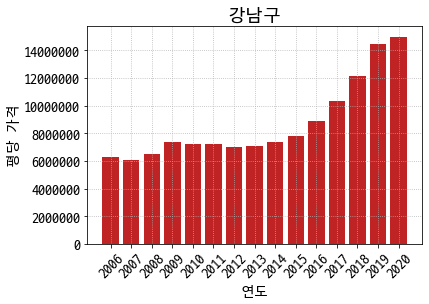

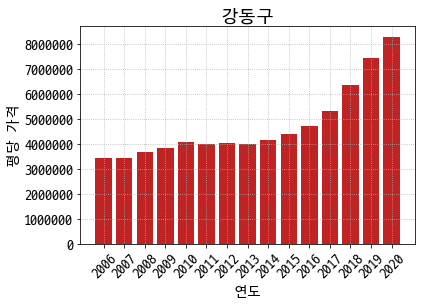

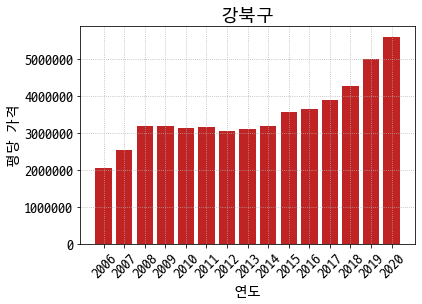

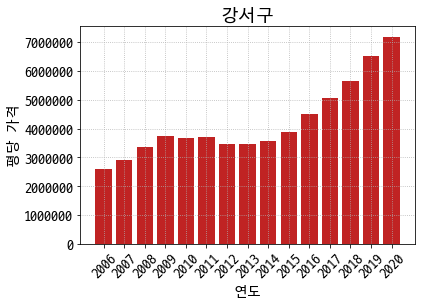

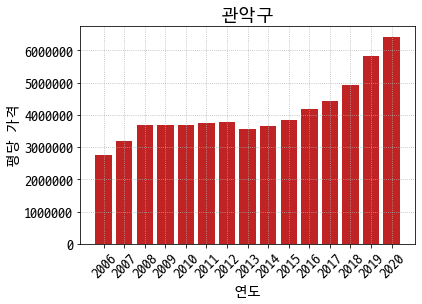

...

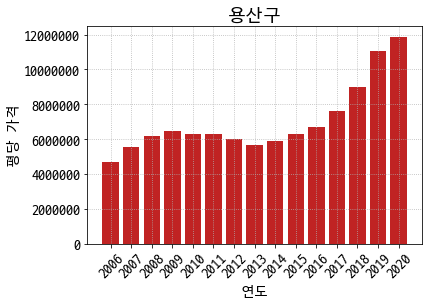

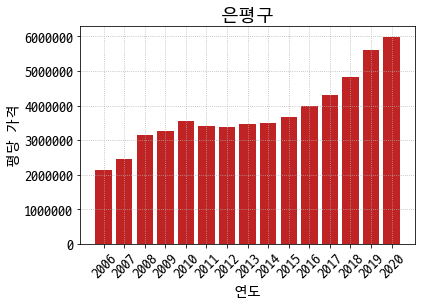

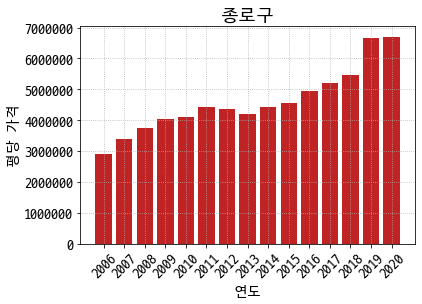

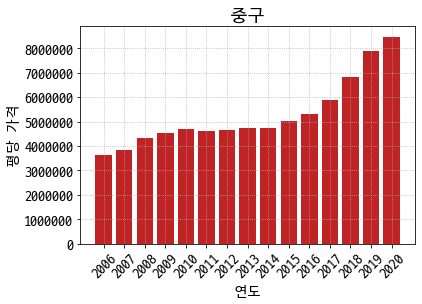

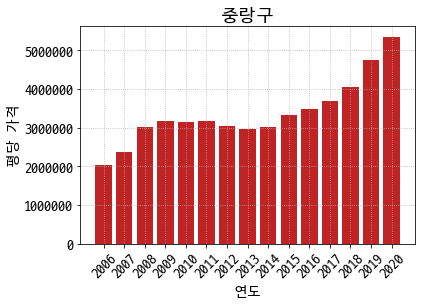

In [7]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for name, year_price in region_price.items():
    plt.grid(b=True, ls = ':')
    plt.bar(year_price[0], year_price[1], color='#c02323')
    plt.title(name, fontsize=18)
    plt.xticks(year_price[0], rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('연도', fontsize=14)
    plt.ylabel('평당 가격', fontsize=14)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()

# 2. 역까지 거리와 평당 가격
## 2.1. 정보 취합

In [8]:
# 역 거리와 함께 dict에 저장
data_station = {} # data_station { 거래연도: (역까지의 거리, 평당가격) }

for x in data[['distStation', 'price', 'contactDate', 'supplyArea']].values:
    distStation = float(x[0])
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
    if year in data_station:
        data_station[year].append((distStation, price/supplyArea))
    else:
        data_station[year] = [(distStation, price/supplyArea)]

In [9]:
# check
data_station

{2005: [(431.24, 1557944.606413994)],
 2012: [(825.4, 6697787.700426223),
  (825.4, 5885934.645829105),
  (1155.09, 7555615.843733044),
  (453.92, 7685352.622061484),
  (380.86, 7435753.842324683),
  (380.86, 6552364.311455717),
  (768.86, 5386509.108813393),
  (544.04, 9049342.731948942),
  (544.04, 9469309.898494449),
  (544.04, 7620499.1426938465),
  (544.04, 6589107.381859364),
  (1282.9, 933663.2276737781),
  (1416.28, 4371812.220256063),
  (269.31, 7073274.036425244),
  (269.31, 6635606.381476776),
  (269.31, 5309734.513274336),
  (269.31, 6673197.0123668425),
  (269.31, 6460176.9911504425),
  (269.31, 6755612.0288013555),
  (269.31, 6141465.480728505),
  (269.31, 6548672.566371681),
  (269.31, 6734419.003305987),
  (269.31, 6459127.488352393),
  (269.31, 6489531.039549406),
  (269.31, 6230088.495575221),
  (269.31, 6194690.265486726),
  (269.31, 5575221.238938053),
  (269.31, 6070873.923478752),
  (269.31, 6194690.265486726),
  (269.31, 6070873.923478752),
  (269.31, 5788507.694

## 2.2. 그래프 데이터 설정

In [10]:
for y, d in data_station.items():
    data_station[y] = sorted(d)

data_station_list = sorted(list(data_station.items()))

data_station_list
station_price = {}  # { '거래연도': [[x(역까지의 거리)], [y(평당 평균가)]] }
for d in data_station_list:
    station_price[d[0]] = [[], []]
    for dps in d[1]:
        station_price[d[0]][0].append(dps[0]) # 역까지의 거리
        station_price[d[0]][1].append(dps[1]) # 평당 평균가
station_price

{2005: [[431.24], [1557944.606413994]],
 2006: [[11.35,
   33.18,
   33.18,
   33.55,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   34.67,
   36.55,
   37.17,
   37.17,
   41.23,
   41.23,
   41.23,
   41.23,
   41.23,
   41.23,
   41.23,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   42.94,
   48.71,
   48.71,
   48.71,
   48.71,
   48.71,
   48.71,
   49.48,
   49.48,
   49.48,
   49.48,
   49.48,
   49.48,
   49.73,
   49.73,
   53.65,
   53.65,
   53.77,
   53.77,
   53.77,
   57.16,
   61.51,
   61.92,
   61.92,
   62.02,
   63.21,
   63.86,
   64.57,
   67.23,
   67.23,
   67.23,
   67.54,
   67.99,
   67.99,
   67.99,
   67.99,
   6

## 2.3. 그래프 그리기

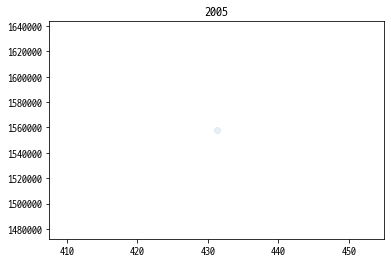

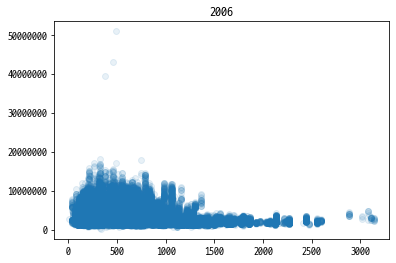

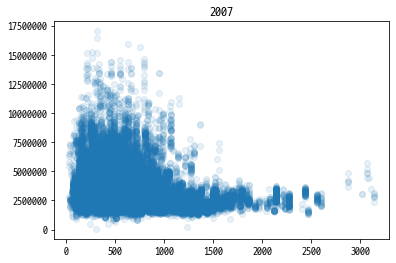

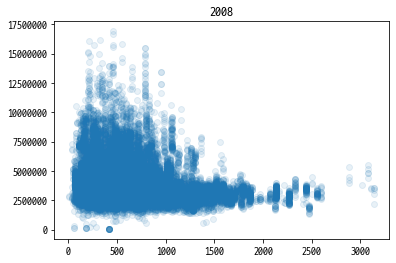

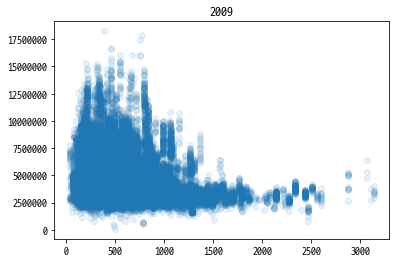

...

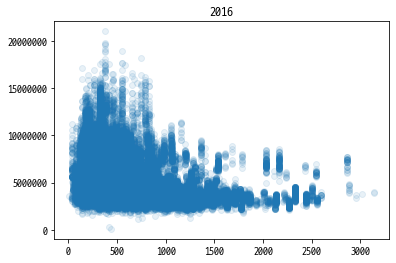

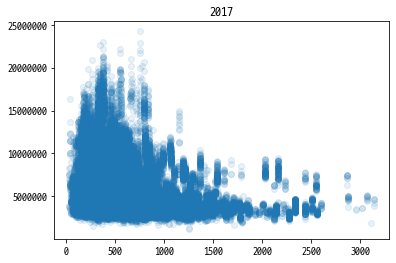

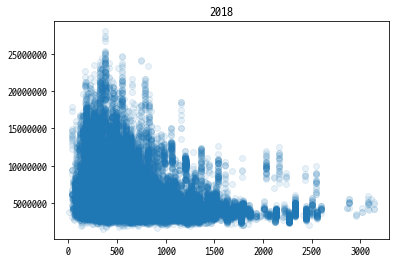

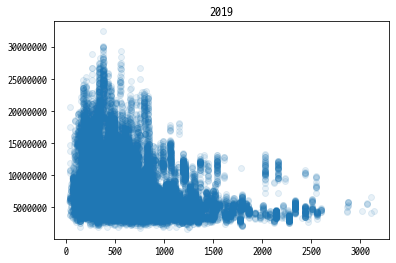

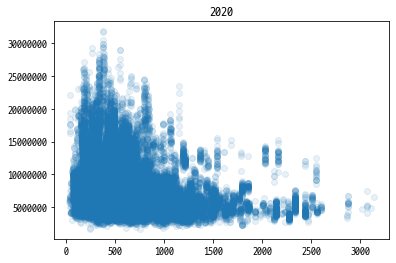

In [11]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for name, dist_price in station_price.items():
    plt.scatter(dist_price[0], dist_price[1], alpha=0.1)
    plt.title(name)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()

# 3. 병원까지 거리와 평당 가격
## 3.1. 정보 취합

In [12]:
# 병원 거리와 함께 dict에 저장
data_hospital = {} # data_hospital { 거래연도: (병원까지의 거리, 평당가격) }

for x in data[['distHospital', 'price', 'contactDate', 'supplyArea']].values:
    distHospital = float(x[0])
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
    if year in data_hospital:
        data_hospital[year].append((distHospital, price/supplyArea))
    else:
        data_hospital[year] = [(distHospital, price/supplyArea)]

In [13]:
# check
data_hospital

{2005: [(2396.21, 1557944.606413994)],
 2012: [(1401.62, 6697787.700426223),
  (1401.62, 5885934.645829105),
  (2020.72, 7555615.843733044),
  (1296.14, 7685352.622061484),
  (1177.44, 7435753.842324683),
  (1177.44, 6552364.311455717),
  (1339.56, 5386509.108813393),
  (1136.1, 9049342.731948942),
  (1136.1, 9469309.898494449),
  (1136.1, 7620499.1426938465),
  (1136.1, 6589107.381859364),
  (2226.8, 933663.2276737781),
  (2130.75, 4371812.220256063),
  (1063.02, 7073274.036425244),
  (1063.02, 6635606.381476776),
  (1063.02, 5309734.513274336),
  (1063.02, 6673197.0123668425),
  (1063.02, 6460176.9911504425),
  (1063.02, 6755612.0288013555),
  (1063.02, 6141465.480728505),
  (1063.02, 6548672.566371681),
  (1063.02, 6734419.003305987),
  (1063.02, 6459127.488352393),
  (1063.02, 6489531.039549406),
  (1063.02, 6230088.495575221),
  (1063.02, 6194690.265486726),
  (1063.02, 5575221.238938053),
  (1063.02, 6070873.923478752),
  (1063.02, 6194690.265486726),
  (1063.02, 6070873.92347875

## 3.2. 그래프 데이터 설정

In [14]:
for y, d in data_hospital.items():
    data_hospital[y] = sorted(d)

data_hospital_list = sorted(list(data_hospital.items()))

data_hospital_list
hospital_price = {}  # { '거래연도': [[x(역까지의 거리)], [y(평당 평균가)]] }
for d in data_hospital_list:
    hospital_price[d[0]] = [[], []]
    for dps in d[1]:
        hospital_price[d[0]][0].append(dps[0]) # 역까지의 거리
        hospital_price[d[0]][1].append(dps[1]) # 평당 평균가
hospital_price

{2005: [[2396.21], [1557944.606413994]],
 2006: [[62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   62.3,
   64.96,
   64.96,
   64.96,
   64.96,
   64.96,
   64.96,
   64.96,
   64.96,
   72.73,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   73.28,
   75.61,
   88.2,
   88.2,
   88.2,
   88.2,
   88.2,
   88.2,
   94.19,
   94.19,
   94.19,
   94.19,
   94.19,
   94.19,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.9,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94.97,
   94

## 3.3. 그래프 그리기

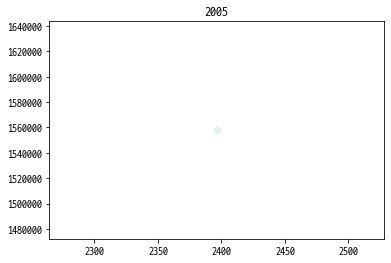

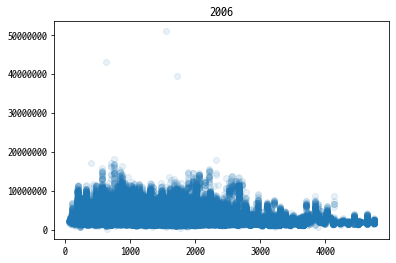

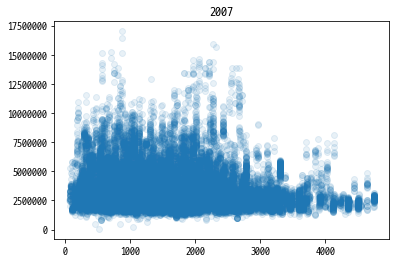

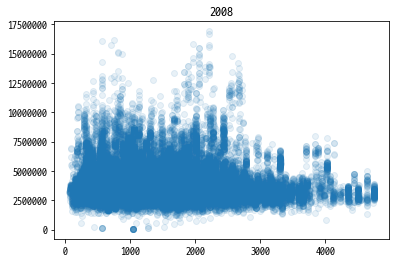

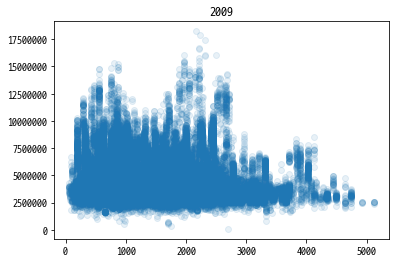

...

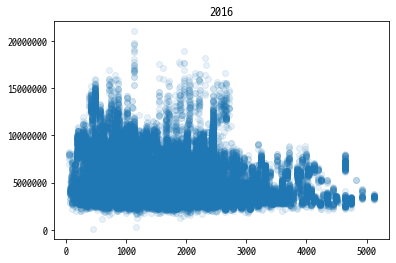

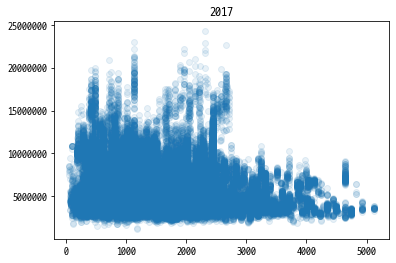

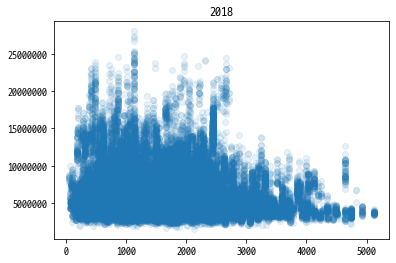

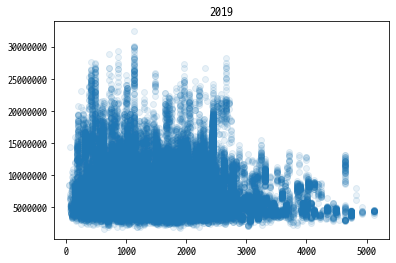

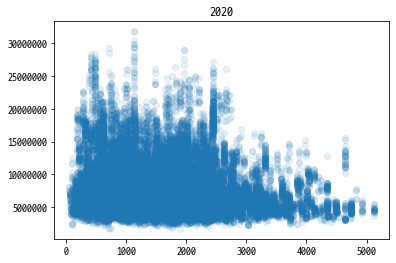

In [15]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for name, dist_price in hospital_price.items():
    plt.scatter(dist_price[0], dist_price[1], alpha=0.1)
    plt.title(name)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()

# 4. 한강까지 거리와 평당 가격
## 4.1. 정보 취합

In [16]:
# 한강 거리와 함께 dict에 저장
data_hangang = {} # data_hangang { 거래연도: (한강까지의 거리, 평당가격) }

for x in data[['distHangangTopBottom', 'price', 'contactDate', 'supplyArea']].values:
    distHangang = float(x[0])
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
    if year in data_hangang:
        data_hangang[year].append((distHangang, price/supplyArea))
    else:
        data_hangang[year] = [(distHangang, price/supplyArea)]

In [17]:
# check
data_hangang

{2005: [(14375.17, 1557944.606413994)],
 2012: [(14322.53, 6697787.700426223),
  (14322.53, 5885934.645829105),
  (5818.99, 7555615.843733044),
  (13899.47, 7685352.622061484),
  (2480.06, 7435753.842324683),
  (2480.06, 6552364.311455717),
  (14284.11, 5386509.108813393),
  (13955.3, 9049342.731948942),
  (13955.3, 9469309.898494449),
  (13955.3, 7620499.1426938465),
  (13955.3, 6589107.381859364),
  (15024.98, 933663.2276737781),
  (14759.66, 4371812.220256063),
  (2629.52, 7073274.036425244),
  (2629.52, 6635606.381476776),
  (2629.52, 5309734.513274336),
  (2629.52, 6673197.0123668425),
  (2629.52, 6460176.9911504425),
  (2629.52, 6755612.0288013555),
  (2629.52, 6141465.480728505),
  (2629.52, 6548672.566371681),
  (2629.52, 6734419.003305987),
  (2629.52, 6459127.488352393),
  (2629.52, 6489531.039549406),
  (2629.52, 6230088.495575221),
  (2629.52, 6194690.265486726),
  (2629.52, 5575221.238938053),
  (2629.52, 6070873.923478752),
  (2629.52, 6194690.265486726),
  (2629.52, 6070

## 4.2. 그래프 데이터 설정

In [18]:
for y, d in data_hangang.items():
    data_hangang[y] = sorted(d)

data_hangang_list = sorted(list(data_hangang.items()))

data_hangang_list
hangang_price = {}  # { '거래연도': [[x(역까지의 거리)], [y(평당 평균가)]] }
for d in data_hangang_list:
    hangang_price[d[0]] = [[], []]
    for dps in d[1]:
        hangang_price[d[0]][0].append(dps[0]) # 역까지의 거리
        hangang_price[d[0]][1].append(dps[1]) # 평당 평균가
hangang_price

{2005: [[14375.17], [1557944.606413994]],
 2006: [[94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   94.64,
   102.52,
   106.31,
   106.31,
   106.31,
   119.85,
   121.54,
   121.54,
   121.54,
   121.54,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   126.66,
   128.47,
   128.49,
   128.49,
   128.49,
   129.36,
   129.36,
   129.56,
   129.56,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   130.53,
   132.69,
   132.69,
   134.95,
   134.95,
   134.95,
   134.95,
   134.95,
   134.95,
   134.95,


## 4.3. 그래프 그리기

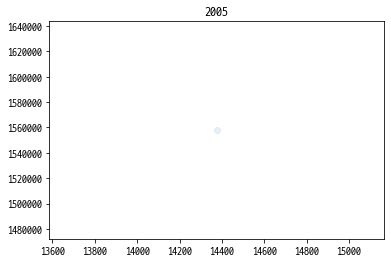

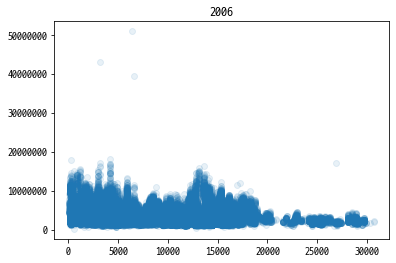

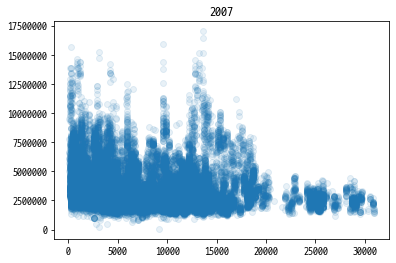

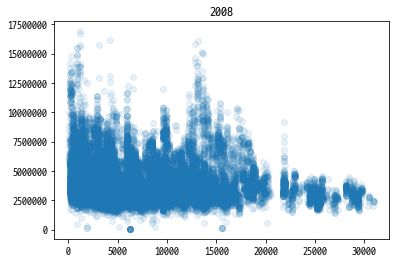

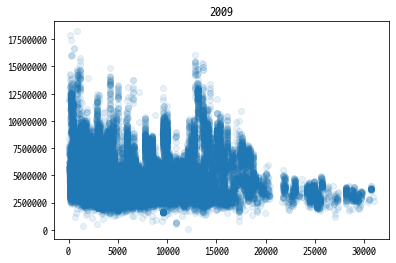

...

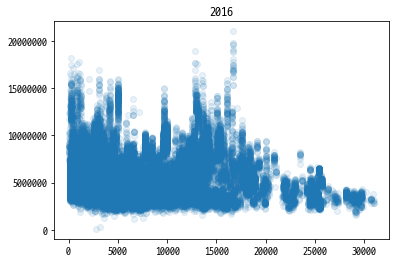

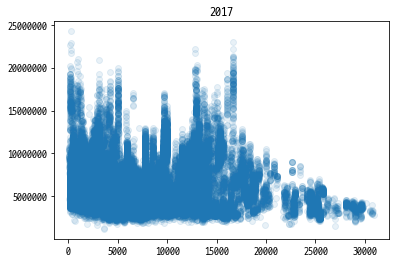

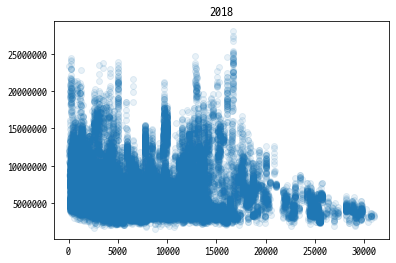

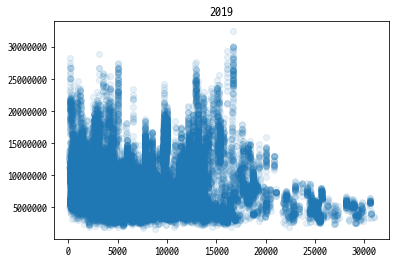

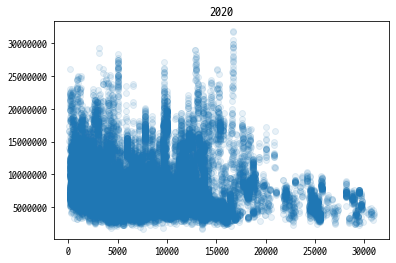

In [20]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for name, dist_price in hangang_price.items():
    plt.scatter(dist_price[0], dist_price[1], alpha=0.1)
    plt.title(name)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()

# 5. 단지 별 가격 추이 표시
## 5.1. 정보 취합

In [21]:
# 단지별로 dict에 저장
data_complex = {} # data_region { 지역(구): (거래연도, 평당가격) }

for x in data[['complexName', 'price', 'contactDate', 'supplyArea']].values:
    complexName = x[0]
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
#     if price < 500000:
#         continue
    if (complexName, year) in data_complex:
        data_complex[(complexName, year)].append(price/supplyArea)
    else:
        data_complex[(complexName, year)] = [price/supplyArea]

In [22]:
# 평당 평균값으로 값 전환
for k, p in data_complex.items():
    p_avg = sum(p) / len(p)
    data_complex[k] = p_avg
data_complex

{('브라운스톤방학아파트', 2005): 1557944.606413994,
 ('개포2차현대아파트(220)', 2012): 6291861.173127664,
 ('개포6차우성아파트1동~8동', 2012): 7555615.843733044,
 ('개포6차우성아파트1동~8동', 2010): 9922489.378010163,
 ('개포우성3차', 2012): 7685352.622061484,
 ('개포자이(12-2)', 2012): 6994059.0768902,
 ('개포우성3차', 2010): 8614894.625295507,
 ('개포2차현대아파트(220)', 2011): 6570935.6606454225,
 ('개포2차현대아파트(220)', 2008): 8118530.545971178,
 ('개포6차우성아파트1동~8동', 2011): 9537207.128855402,
 ('개포2차현대아파트(220)', 2007): 7611122.38684798,
 ('개포자이(12-2)', 2010): 8131209.237517815,
 ('개포2차현대아파트(220)', 2020): 15171503.95778364,
 ('개포6차우성아파트1동~8동', 2007): 11025164.820549846,
 ('개포6차우성아파트1동~8동', 2008): 9361997.226074895,
 ('개포6차우성아파트1동~8동', 2020): 19622812.908493053,
 ('개포우성3차', 2011): 7846610.387128547,
 ('개포우성3차', 2007): 9509757.351681702,
 ('개포우성3차', 2008): 8001808.318264015,
 ('개포자이(12-2)', 2011): 7603168.394289067,
 ('개포자이(12-2)', 2008): 9224690.43618941,
 ('개포자이(12-2)', 2007): 8903484.849316448,
 ('개포2차현대아파트(220)', 2013): 5784453.014004465,
 ('개포6차

## 5.2. 그래프 데이터 설정

In [23]:
data_complex_list = sorted(list(data_complex.items()))
# data_complex_list[:10]

complex_price = {}  # { '지역명': [[x(연도)], [y(평당 평균가)]] }
for d in data_complex_list:
    if d[0][0] in complex_price:
        complex_price[d[0][0]][0].append(d[0][1])
        complex_price[d[0][0]][1].append(d[1])
    else:  #  구 이름      거래연도    가격
        complex_price[d[0][0]] = [[d[0][1]], [d[1]]]
complex_price

{'(1101-1)': [[2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
  [5322003.577817531,
   5033474.592099747,
   5008200.2043981785,
   4948409.094814562,
   5334772.320632579,
   5561484.162089414,
   5418756.571238743,
   5356626.1761139445,
   5576146.774161762]],
 '(13-21)': [[2006, 2007, 2009, 2010, 2012, 2013, 2015, 2016, 2018],
  [2706777.5448184875,
   2461777.6626068926,
   3303964.757709251,
   3368748.380409432,
   3848147.1883907747,
   3887017.362010883,
   4353459.445452189,
   4372894.532262243,
   5009933.488814027]],
 '(145-0)': [[2015, 2016, 2017, 2018, 2019, 2020],
  [4885690.093141405,
   4826418.289585097,
   4623923.602631891,
   4842930.291925345,
   5061287.851296319,
   5133404.409218839]],
 '(1546-0)': [[2016, 2019], [6579662.860250136, 6226209.89668298]],
 '(1617-21)': [[2007, 2008, 2009, 2013, 2015, 2016, 2017, 2018],
  [4460742.976979527,
   4771668.181632915,
   4142625.7395098386,
   4493324.204039712,
   5324857.591017915,
   5583507.066667228,
   55

## 5.3. 그래프 그리기

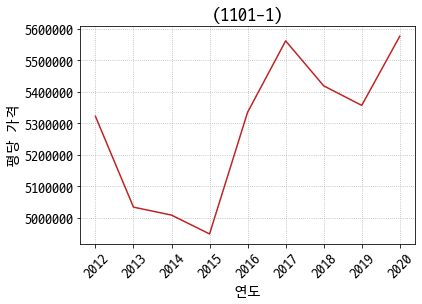

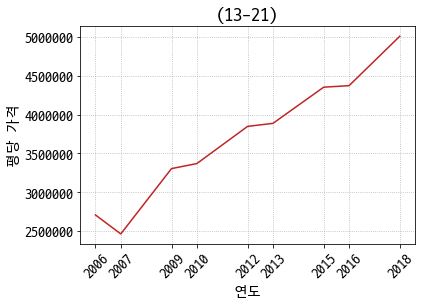

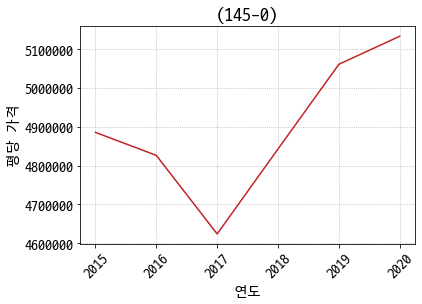

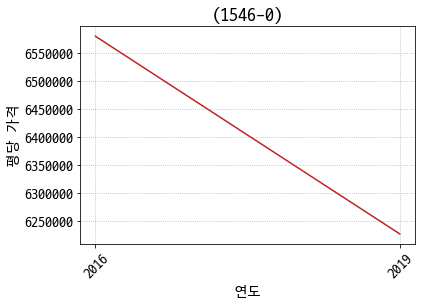

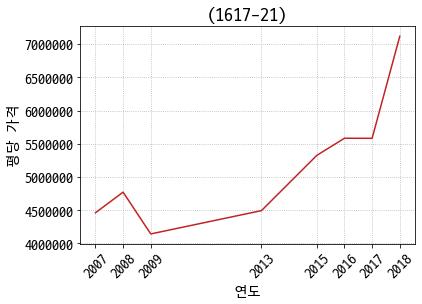

...

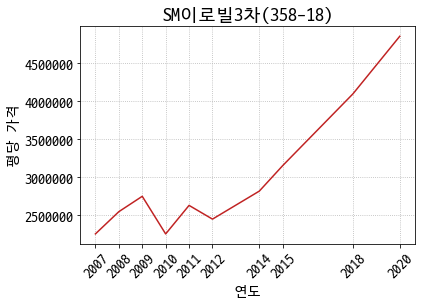

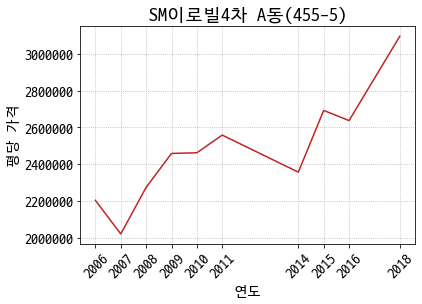

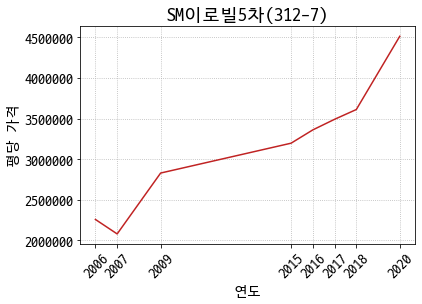

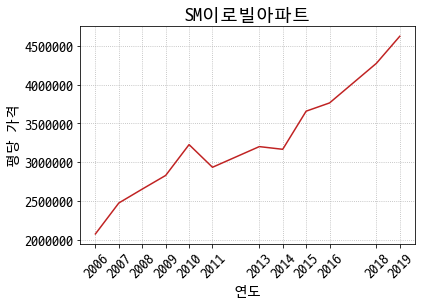

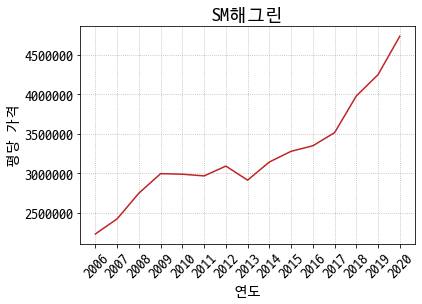

In [24]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for i, (name, year_price) in enumerate(complex_price.items()):
    plt.grid(b=True, ls = ':')
    plt.plot(year_price[0], year_price[1], color='#c02323')
    plt.title(name, fontsize=18)
    plt.xticks(year_price[0], rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('연도', fontsize=14)
    plt.ylabel('평당 가격', fontsize=14)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()
    if i>100:
        break

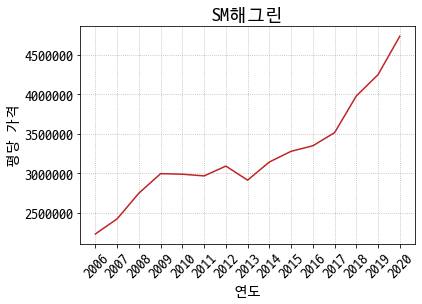

In [25]:
def draw_graph_complex_price(name):
    year_price = complex_price[name]
    plt.grid(b=True, ls = ':')
    plt.plot(year_price[0], year_price[1], color='#c02323')
    plt.title(name, fontsize=18)
    plt.xticks(year_price[0], rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('연도', fontsize=14)
    plt.ylabel('평당 가격', fontsize=14)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()
draw_graph_complex_price('SM해그린') # test

# 6. 건설사별 가격 추이
## 6.1. 정보 취합

In [26]:
# 건설사별로 dict에 저장
data_brand = {} # data_brand { 건설사: (거래연도, 평당가격) }

for x in data[['constructionCompanyName', 'price', 'contactDate', 'supplyArea']].values:
    brand = str(x[0])
    price = float(x[1])
    year = int(x[2].split('-')[0])
    supplyArea = float(x[3])
#     if price < 500000:
#         continue
    if (brand, year) in data_brand:
        data_brand[(brand, year)].append(price/supplyArea)
    else:
        data_brand[(brand, year)] = [price/supplyArea]

In [27]:
# 평당 평균값으로 값 전환
for k, p in data_brand.items():
    p_avg = sum(p) / len(p)
    data_brand[k] = p_avg
data_brand

{('이수건설주식회사', 2005): 1557944.606413994,
 ('현대산업개발(주)', 2012): 4007554.077888097,
 ('우성건설(주)', 2012): 3698082.119026447,
 ('우성건설(주)', 2010): 4202108.475665635,
 ('LG건설(주)', 2012): 4547594.7413096335,
 ('현대산업개발(주)', 2011): 4218085.514686211,
 ('현대산업개발(주)', 2008): 4001604.251999624,
 ('우성건설(주)', 2011): 4064009.4430348626,
 ('현대산업개발(주)', 2007): 3388609.606631492,
 ('LG건설(주)', 2010): 5080004.893316085,
 ('현대산업개발(주)', 2020): 7820869.436942859,
 ('우성건설(주)', 2007): 3580967.478364227,
 ('우성건설(주)', 2008): 3973296.6933981143,
 ('우성건설(주)', 2020): 7678620.335860992,
 ('LG건설(주)', 2011): 4745033.78785067,
 ('LG건설(주)', 2008): 4999992.650611709,
 ('LG건설(주)', 2007): 4770898.937528294,
 ('현대산업개발(주)', 2013): 3922228.9299363038,
 ('우성건설(주)', 2013): 3678227.11698035,
 ('현대산업개발(주)', 2009): 4388768.958481792,
 ('우성건설(주)', 2009): 4294651.354097912,
 ('LG건설(주)', 2020): 8591633.394972663,
 ('현대산업개발(주)', 2014): 4210883.885496768,
 ('우성건설(주)', 2014): 3854450.1539237644,
 ('LG건설(주)', 2013): 4509184.5995384995,
 ('현

## 6.2. 그래프 데이터 설정

In [28]:
data_brand_list = sorted(list(data_brand.items()))
# data_brand_list[:10]

brand_price = {}  # { '브랜드명': [[x(연도)], [y(평당 평균가)]] }
for d in data_brand_list:
    if d[0][0] in brand_price:
        brand_price[d[0][0]][0].append(d[0][1])
        brand_price[d[0][0]][1].append(d[1])
    else:  #  구 이름      거래연도    가격
        brand_price[d[0][0]] = [[d[0][1]], [d[1]]]
brand_price

{'((주)심원디엔씨)': [[2016, 2017, 2018, 2019, 2020],
  [4487534.626038781,
   4544678.581393882,
   4689475.816682937,
   4714266.136768535,
   4861560.18331103]],
 '(유)25종합건설': [[2007, 2008, 2009, 2011, 2014, 2016, 2017, 2018, 2019, 2020],
  [2427256.612091731,
   2983771.9527812256,
   3078640.0768781095,
   2807316.0357294767,
   3008094.5088602058,
   3424163.0437164814,
   3062526.5844321568,
   3317737.1331348363,
   3555020.7831984246,
   4156639.684970466]],
 '(유)동우에스제이종합개발': [[2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
  [3383600.67491888,
   3325473.3552203216,
   3671192.083340328,
   3271028.037383178,
   3671892.3638834073,
   3891666.73777288,
   5347593.582887701,
   4958073.744863592]],
 '(유)동호에스제이종합개발': [[2009,
   2010,
   2011,
   2012,
   2013,
   2014,
   2015,
   2016,
   2017,
   2018,
   2019,
   2020],
  [4450175.922542406,
   3833796.057221938,
   3463975.6675889594,
   3302323.6736955866,
   3303054.5210405514,
   3256383.981270502,
   3605582.785680701,
   3

## 6.3. 그래프 그리기

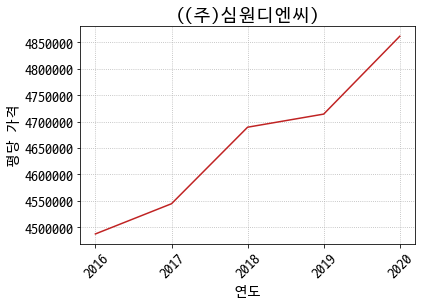

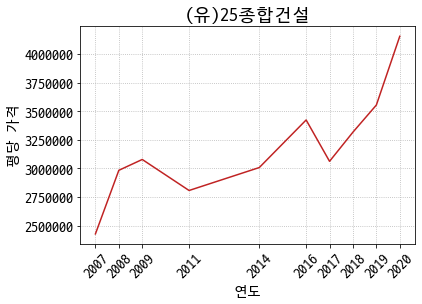

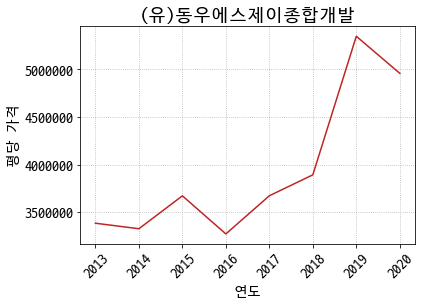

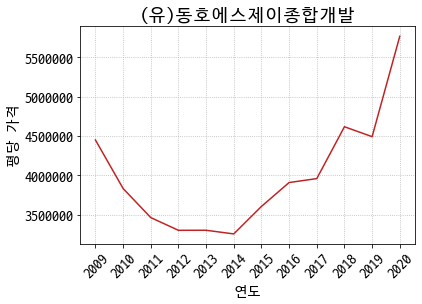

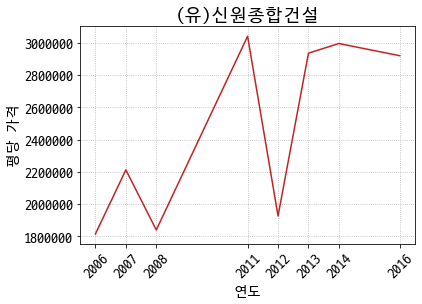

...

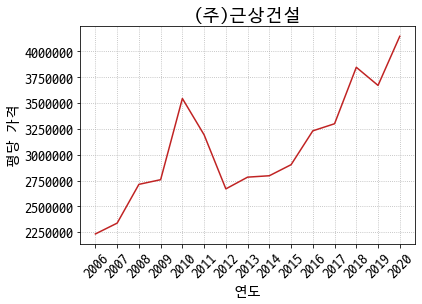

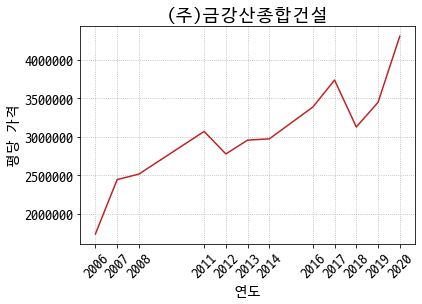

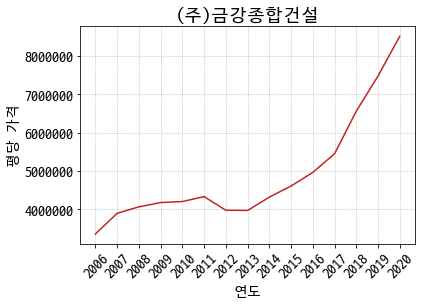

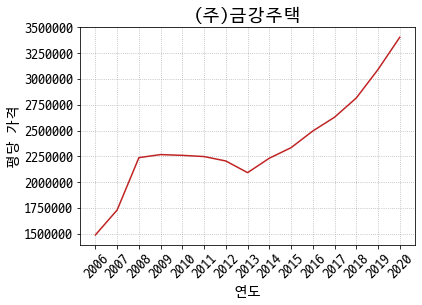

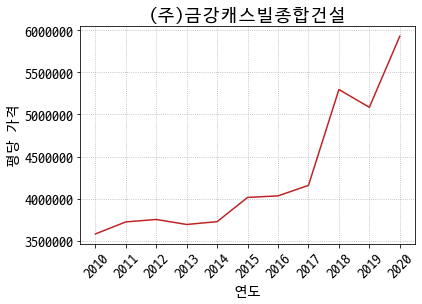

In [29]:
# 폰트 설정
plt.rcParams['font.family'] = 'D2Coding' # D2 Coding 폰트가 깔려 있어야 한다.
for i, (name, year_price) in enumerate(brand_price.items()):
    plt.grid(b=True, ls = ':')
    plt.plot(year_price[0], year_price[1], color='#c02323')
    plt.title(name, fontsize=18)
    plt.xticks(year_price[0], rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('연도', fontsize=14)
    plt.ylabel('평당 가격', fontsize=14)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()
    if i>100:
        break

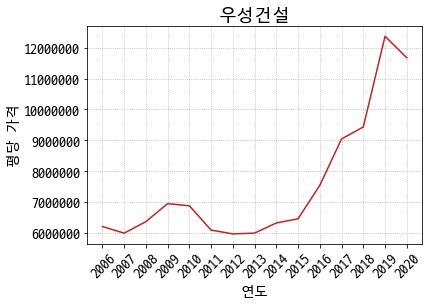

In [30]:
def draw_graph_brand_price(name):
    year_price = brand_price[name]
    plt.grid(b=True, ls = ':')
    plt.plot(year_price[0], year_price[1], color='#c02323')
    plt.title(name, fontsize=18)
    plt.xticks(year_price[0], rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('연도', fontsize=14)
    plt.ylabel('평당 가격', fontsize=14)
    plt.ticklabel_format(style='plain', useLocale=True)
#     plt.ylim(0, 20000000)
    plt.show()
draw_graph_brand_price('우성건설')